<a href="https://colab.research.google.com/github/Dyinastie/PVCK_3D_Dyinastie/blob/main/PCVK_Jobsheet11.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# **PRAKTIKUM**

## **Langkah 1 : Import Library**

In [ ]:
import cv2 as cv
import numpy as np
import matplotlib.pyplot as plt

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


## **Langkah 2 : Template Matching**

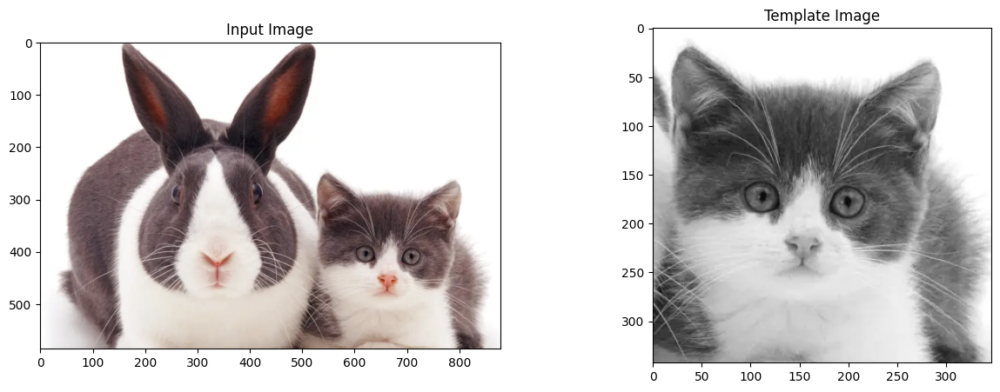

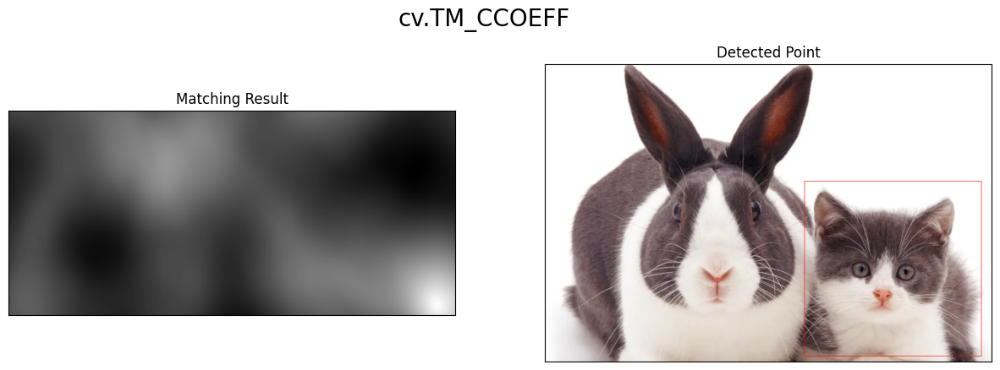

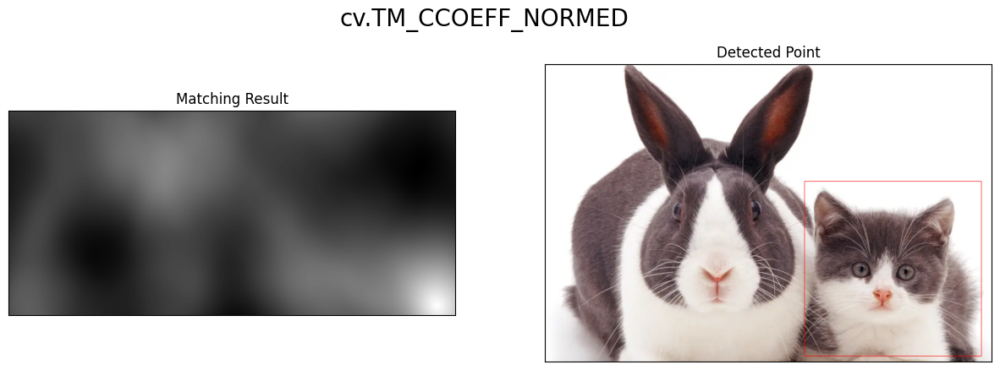

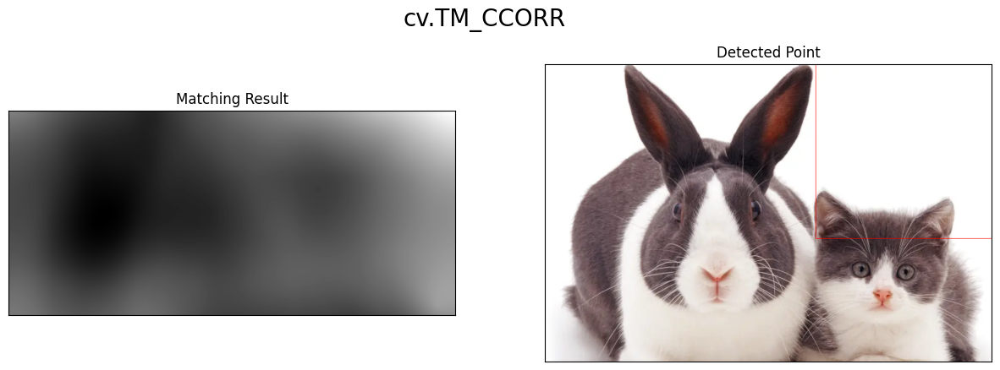

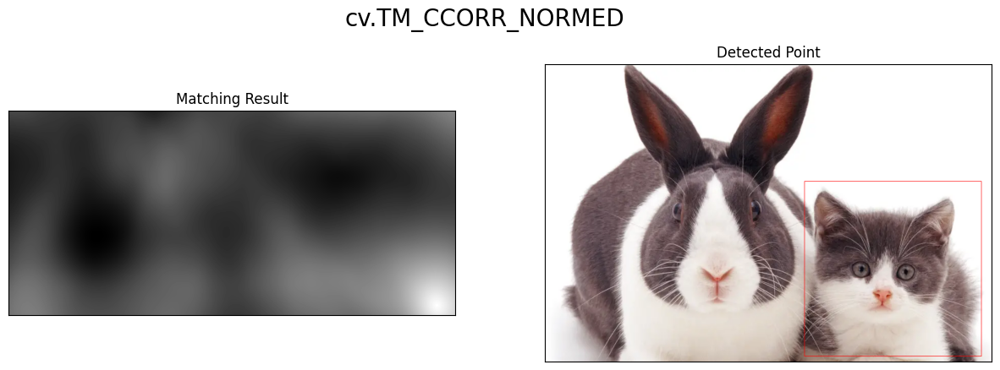

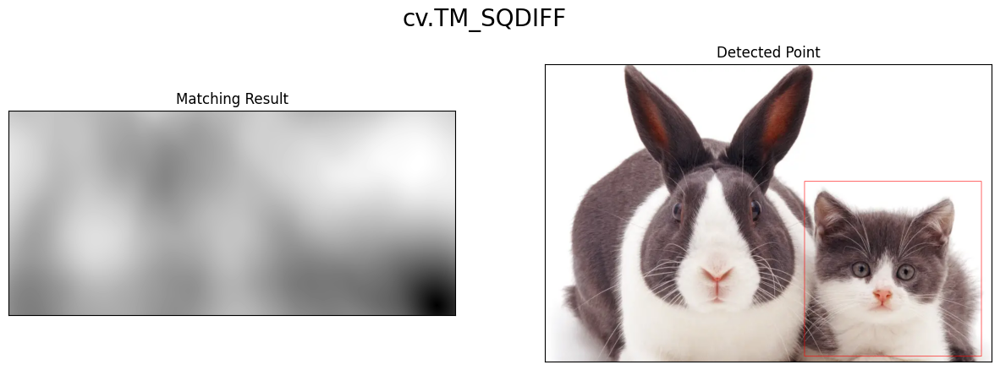

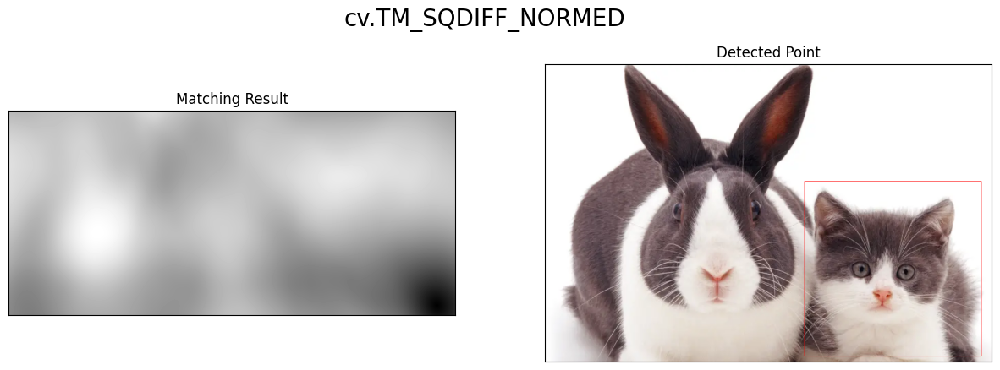

In [ ]:
# Load citra input
img = cv.imread('/content/drive/MyDrive/Images/Cats_and_bunnies.jpg')
img_gray = cv.cvtColor(img,cv.COLOR_BGR2GRAY)
img2 = img.copy()

# Load citra template
template = cv.imread('/content/drive/MyDrive/Images/Cats_template.jpg',0)
# dimensi citra
w, h = template.shape[::-1]

# Print input dan template image
f, axarr = plt. subplots(1,2,figsize=(15,5))
axarr[0].imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB)), axarr[0].set_title("Input Image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("Template Image")

# Metode yang digunakan
methods = ['cv.TM_CCOEFF', 'cv.TM_CCOEFF_NORMED', 'cv.TM_CCORR',
            'cv.TM_CCORR_NORMED', 'cv.TM_SQDIFF', 'cv.TM_SQDIFF_NORMED']

for meth in methods:
    img = img2.copy()
    method = eval(meth)
    # Mengaplikasikan template matching
    res = cv.matchTemplate(img_gray,template,method)
    min_val, max_val, min_loc, max_loc = cv.minMaxLoc(res)
    # If the method is TM_SQDIFF or TM_SQDIFF_NORMED, take minimum
    if method in [cv.TM_SQDIFF, cv.TM_SQDIFF_NORMED]:
        top_left = min_loc
    else:
        top_left = max_loc
    bottom_right = (top_left[0] + w, top_left[1] + h)

    cv.rectangle(img,top_left, bottom_right,(0,0,255))
    plt.figure(figsize=(15,5))
    plt.subplot(121),plt.imshow(res,cmap = 'gray')
    plt.title('Matching Result'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))
    plt.title('Detected Point'), plt.xticks([]), plt.yticks([])
    print("\n\n")
    plt.suptitle(meth, fontsize=20)
    plt.show()

## **Langkah 3 : Template Matching Tanpa Library**

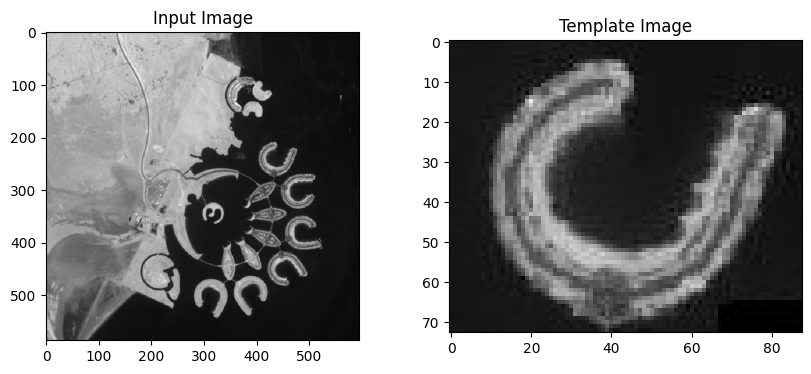

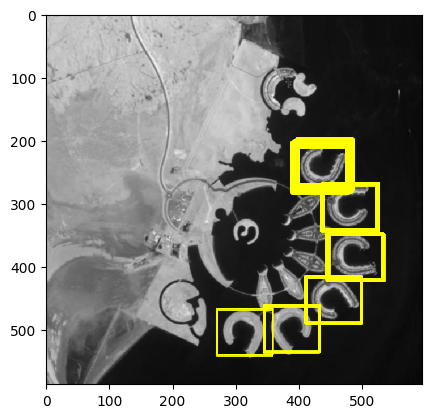

In [ ]:
# Load input dan template image
main_image = cv.imread('/content/drive/MyDrive/Images/Bahrain.jpg', 0)
template = cv.imread('/content/drive/MyDrive/Images/Bahrain-template.jpg', 0)

# Menampilkan gambar utama dan template
f, axarr = plt.subplots(1, 2, figsize=(10, 4))
axarr[0].imshow(cv.cvtColor(main_image, cv.COLOR_BGR2RGB)), axarr[0].set_title("Input Image")
axarr[1].imshow(cv.cvtColor(template, cv.COLOR_BGR2RGB)), axarr[1].set_title("Template Image")

# Template matching menggunakan cross-correlation yang dinormalisasi
result = np.zeros((main_image.shape[0] - template.shape[0] + 1, main_image.shape[1] - template.shape[1] + 1))

# Iterasi pada setiap posisi untuk menghitung skor korelasi
for i in range(result.shape[0]):
    for j in range(result.shape[1]):
        region = main_image[i:i + template.shape[0], j:j + template.shape[1]]
        # Menghitung cross-correlation secara manual
        score = np.sum((region - np.mean(region)) * (template - np.mean(template)))
        score /= (np.std(region) * np.std(template) * region.size)
        result[i, j] = score

# Menentukan threshold untuk pencocokan
threshold = 0.45
locations = np.where(result >= threshold)

# Menampilkan hasil pencocokan
fig, ax = plt.subplots()
ax.imshow(main_image, cmap=plt.cm.gray)
height, width = template.shape
for loc in zip(*locations[::-1]):  # iterasi pada setiap lokasi yang ditemukan
    rect = plt.Rectangle(loc, width, height, edgecolor='yellow', facecolor='none', linewidth=0.5)
    ax.add_patch(rect)

plt.show()

## **Langkah 4 : Implementasi Metode Edge Detection**

**Sobel Edge Detection**

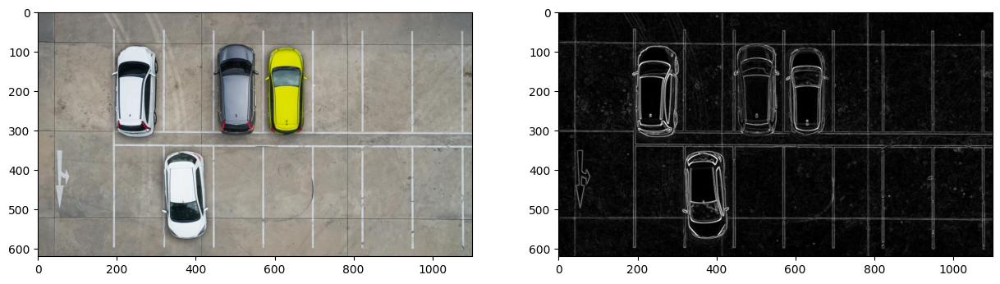

In [ ]:
sobel_car = cv.imread('/content/drive/MyDrive/Images/Car-park.jpg')

# converting to gray scale
gray = cv.cvtColor(sobel_car, cv.COLOR_BGR2GRAY)

# remove noise
img_n = cv.GaussianBlur(gray,(3,3),0)

# obtaining a horizontal and vertical Sobel filtering of the image
img_sobelx = cv.Sobel(img_n, cv.CV_64F, 1, 0, ksize=3)
img_sobely = cv.Sobel(img_n, cv.CV_64F, 0, 1, ksize=3)

# image with both horizontal and vertical Sobel kernels applied
img_sobelxy = cv.addWeighted(cv.convertScaleAbs(img_sobelx), 0.5, cv.convertScaleAbs(img_sobely), 0.5, 0)

f, axarr = plt. subplots(1,2,figsize=(15,5))
plt.subplot(121),plt.imshow(cv.cvtColor(sobel_car, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(sobel_car, cv.COLOR_BGR2RGB))
plt.subplot(122),plt.imshow(img_sobelxy, cmap = 'gray')
axarr[1].imshow(cv.cvtColor(img_sobelxy, cv.COLOR_BGR2RGB))

**Canny Edge Detection**

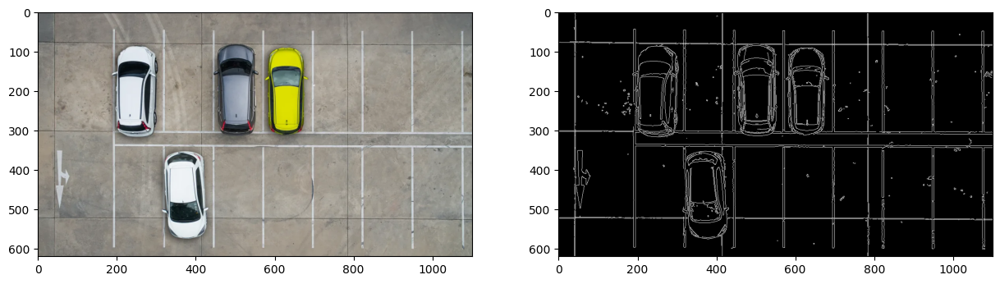

In [ ]:
canny_edge = cv.Canny(sobel_car, 100, 200)

f, axarr = plt.subplots(1,2,figsize=(15,5))
plt.subplot(121), plt.imshow(cv.cvtColor(sobel_car, cv.COLOR_BGR2RGB))
axarr[0].imshow(cv.cvtColor(sobel_car, cv.COLOR_BGR2RGB))
plt.subplot(122), plt.imshow(canny_edge, cmap = 'gray')
axarr[1].imshow(cv.cvtColor(canny_edge, cv.COLOR_BGR2RGB))

**Laplacian Edge Detection**

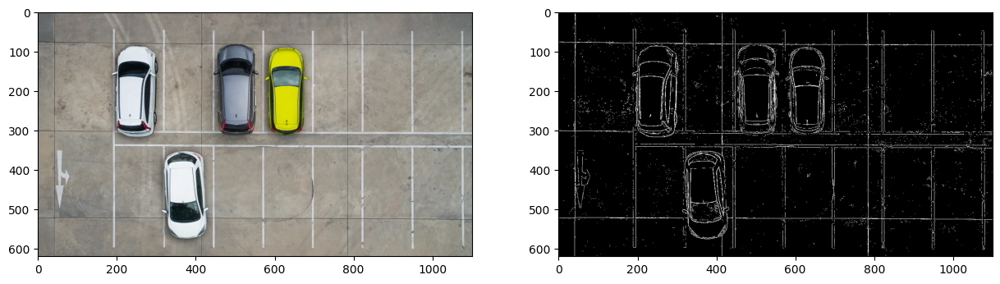

In [ ]:
laplacian_car = cv.imread('/content/drive/MyDrive/Images/Car-park.jpg', cv.IMREAD_COLOR)

# Remove noise
image_gray = cv.cvtColor(laplacian_car, cv.COLOR_BGR2GRAY)

# Laplacian
laplacian = cv.Laplacian(gray, cv.CV_64F)
_, binary = cv.threshold(laplacian, 30, 255, cv.THRESH_BINARY)

f, axarr = plt.subplots(1, 2, figsize=(15, 5))
axarr[0].imshow(cv.cvtColor(laplacian_car, cv.COLOR_BGR2RGB))
axarr[1].imshow(binary, cmap='gray')
plt.show()

## **Langkah 5 : Implementasi Corner Detection**

**Harris Corner Detection**

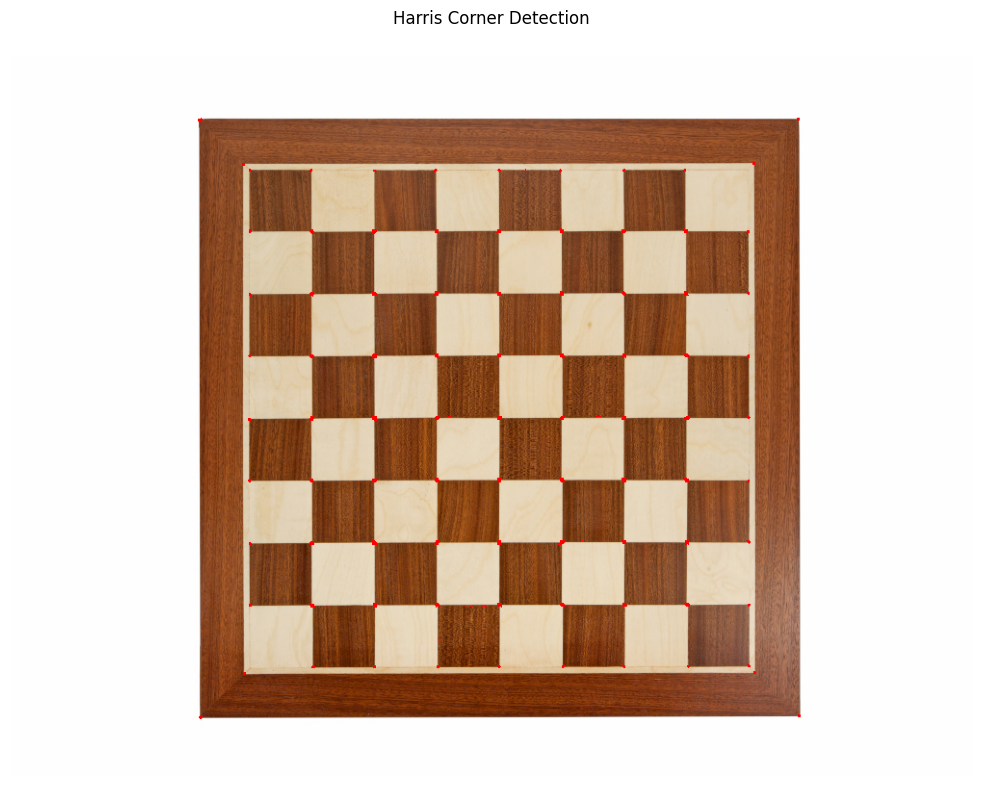

In [ ]:
# Load gambar
filename = cv.imread('/content/drive/MyDrive/Images/Chess-board.jpg')
gray_img = cv.cvtColor(filename, cv.COLOR_BGR2GRAY)

# Menerapkan Harris Corner Detection
dst = cv.cornerHarris(gray_img, 3, 1, 0.04)

# Konversi ke tipe float32 untuk deteksi sudut
gray_img = np.float32(gray_img)

# Penerapan Harris Corner Detection sekali lagi
harris_output = cv.cornerHarris(gray_img, 2, 3, 3)

# Melakukan dilasi pada hasil deteksi sudut
harris_output = cv.dilate(harris_output, None)

# Menandai sudut dengan warna merah
filename[dst > 0.01 * dst.max()] = [0, 0, 255]

plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(filename, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Harris Corner Detection')
plt.show()

**Shi-Thomasi Detection**

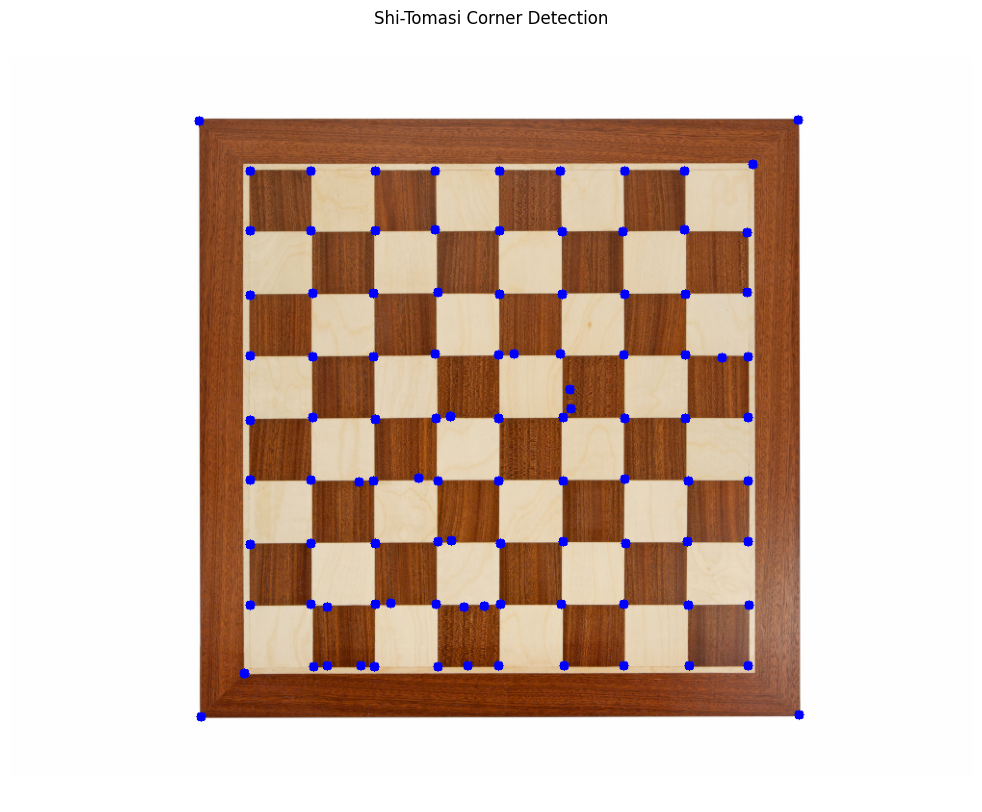

In [ ]:
# Load gambar
filename = cv.imread('/content/drive/MyDrive/Images/Chess-board.jpg')
gray_img = cv.cvtColor(filename, cv.COLOR_BGR2GRAY)

# Menerapkan Shi-Tomasi Corner Detection
corners = cv.goodFeaturesToTrack(gray_img, maxCorners=100, qualityLevel=0.01, minDistance=10)
corners = np.intp(corners)

# Menandai sudut dengan warna biru
for corner in corners:
    x, y = corner.ravel()
    cv.circle(filename, (x, y), 5, (255, 0, 0), -1)  # Warna biru dalam BGR

plt.figure(figsize=(20, 10))
plt.imshow(cv.cvtColor(filename, cv.COLOR_BGR2RGB))
plt.axis('off')
plt.title('Shi-Tomasi Corner Detection')
plt.show()

## **Langkah 6 : Implementasi Grid Detection**

number of Hough lines: 33
Number of filtered lines: 1
Number of filtered lines: 2
Number of filtered lines: 3
Number of filtered lines: 4
Number of filtered lines: 5
Number of filtered lines: 6
Number of filtered lines: 7
Number of filtered lines: 8
Number of filtered lines: 9
Number of filtered lines: 10
Number of filtered lines: 11
Number of filtered lines: 12
Number of filtered lines: 13
Number of filtered lines: 14
Number of filtered lines: 14
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 15
Number of filtered lines: 16
Number of filtered lines: 16
Number of filtered lines: 17
Number of filtered lines: 17
Number of filtered lines: 18
Number of filtered lines: 18
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 19
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20
Number of filtered lines: 20


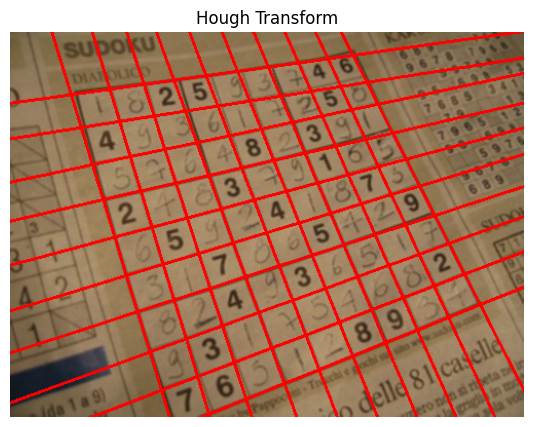

In [ ]:
img_hough = cv.imread('/content/drive/MyDrive/Images/Sudoku.jpg')
img_gs = cv.cvtColor(img_hough, cv.COLOR_BGR2GRAY)

edges = cv.Canny (img_gs, 90, 150, apertureSize = 3)

kernel = np.ones((3,3), np.uint8)
edges = cv.dilate(edges, kernel, iterations = 1)

kernel = np.ones((5,5), np.uint8)
edges = cv.erode (edges, kernel, iterations = 1)

lines = cv.HoughLines(edges, 1, np.pi / 180, 150)


if not lines.any():
    print('No lines were found')
    exit()

if filter:
    rho_threshold = 15
    theta_threshold = 0.1


    similar_lines = {i : [] for i in range(len(lines))}
    for i in range(len(lines)):
      for j in range (len (lines)):
        if i == j:
            continue

        rho_i, theta_i = lines[i][0]
        rho_j, theta_j = lines[j][0]
        if abs(rho_i - rho_j) < rho_threshold and abs (theta_i - theta_j) < theta_threshold:
            similar_lines[i].append(j)


    indices = [i for i in range(len(lines))]
    indices.sort(key=lambda x: len(similar_lines[x]))

    line_flags = len(lines) *[True]
    for i in range(len(lines) - 1):
        if not line_flags [indices[i]]:
            continue

        for j in range(i + 1, len(lines)):
            if not line_flags[indices[j]]:
                continue
            rho_i, theta_i = lines[indices[i]][0]
            rho_j, theta_j = lines[indices[j]][0]
            if abs(rho_i - rho_j) < rho_threshold and abs(theta_i - theta_j) < theta_threshold:
                line_flags [indices[j]] = False
    print('number of Hough lines:', len(lines))

    filtered_lines = []

    if filter:
        for i in range(len(lines)):
            if line_flags[i]:
                filtered_lines.append(lines[i])

            print('Number of filtered lines:', len(filtered_lines ))
    else:
        filtered_lines = lines

    for line in filtered_lines:
        rho, theta = line [0]
        a = np.cos(theta)
        b = np.sin(theta)
        x0 = a*rho
        y0 = b*rho
        x1 = int(x0 + 1000*(-b))
        y1 = int(y0 + 1000*(a))
        x2 = int(x0 - 1000*(-b))
        y2 = int(y0 - 1000*(a))

        cv.line(img_hough, (x1, y1), (x2,y2),(0,0,255),2)

    plt.figure(figsize=(15,5))
    plt.imshow(cv.cvtColor(img_hough, cv.COLOR_BGR2RGB))
    plt.title('Hough Transform')
    plt.axis('off')
    plt.show()

## **Langkah 7 : Implementasi Contour Detection**

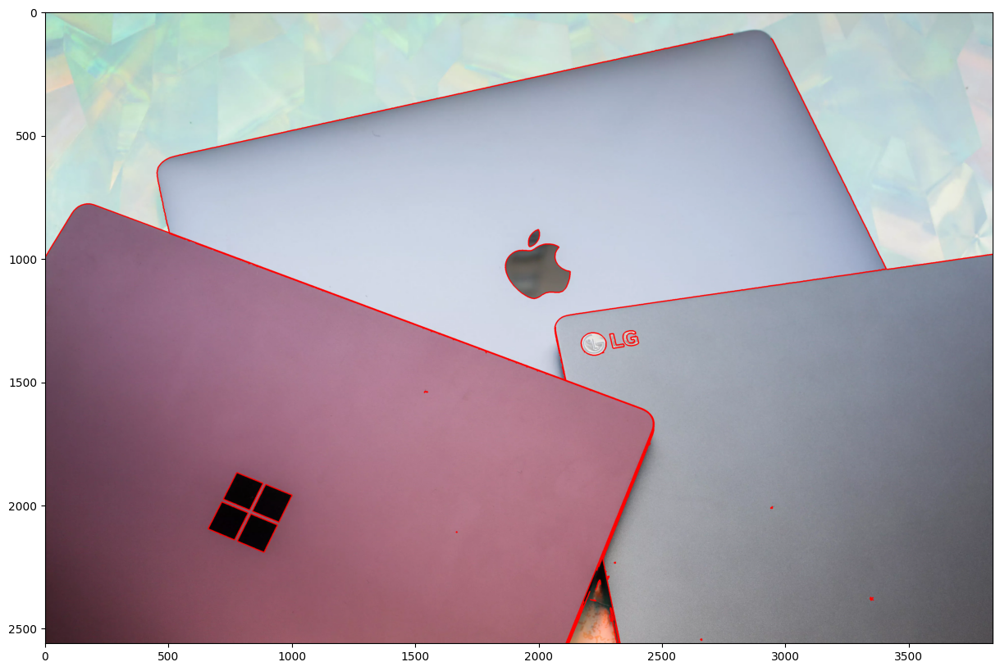

In [ ]:
# Load gambar
img = cv.imread('/content/drive/MyDrive/Images/Laptop.jpg')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

# Edge detection dengan Metode Canny
edged = cv.Canny(img_gray, 30, 200)

# Menemukan kontur pada gambar berdasarkan hasil deteksi tepi
contours, hierarchy = cv.findContours(edged, cv.RETR_EXTERNAL, cv.CHAIN_APPROX_NONE)

# Menggambar kontur dengan library
cv.drawContours(img, contours, -1, (0,0,255), 3)

plt.figure(figsize=(20,10))
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

# **PRAKTIKUM KTP**

**1. Load KTP**

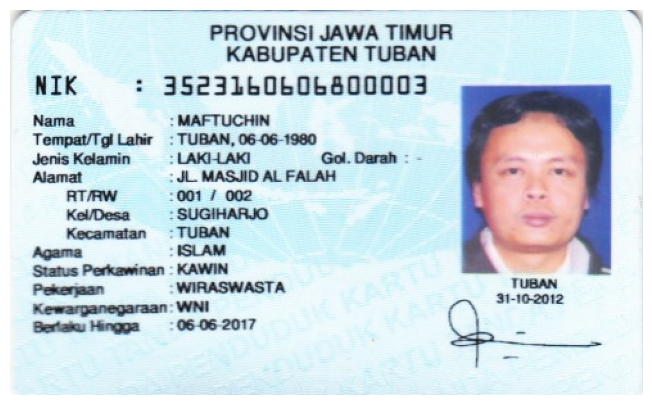

In [ ]:
img = cv.imread('/content/drive/MyDrive/Images/KTP/KTP3.png')
plt.figure(figsize=(15,5))
plt.axis('off')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

**2. Import Library**

In [ ]:
import cv2
import os

**3. Lokalisasi Dataset**

In [ ]:
# Lokasi hasil pelat
path_plate = "/content/drive/MyDrive/Images/KTP"

# Looping file di direktori
for name_file in sorted(os.listdir(path_plate)):
  src = cv2.imread(os.path.join(path_plate, name_file))
  blurred = src.copy()
  gray = blurred.copy()

**4. Terapkan Gaussian Blur**

In [ ]:
# Filtering
for i in range(10):
  blurred = cv2.GaussianBlur(src, (5, 5), 0.5)

**5. Koversi Grayscale dan Thresholding**

In [ ]:
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)

# Binarisasi citra (Thresholding)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY
+ cv2.THRESH_OTSU)
print(ret, bw.shape)

168.0 (300, 493)


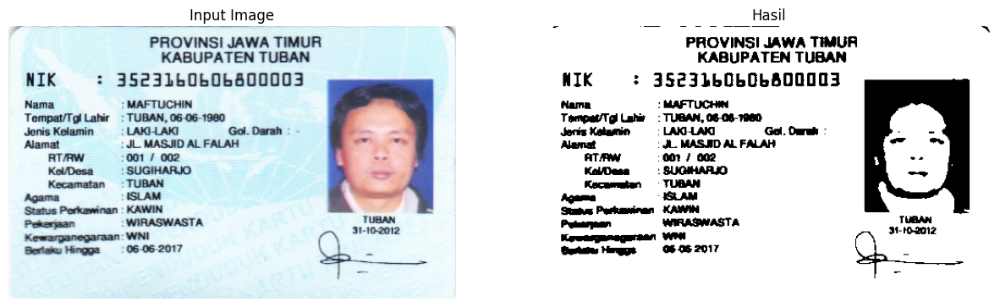

In [ ]:
# Tampilkan gambar asli dan hasil deteksi tepi
f, axarr = plt.subplots(1,2,figsize=(15,5))
axarr[0].imshow(cv2.cvtColor(img, cv2.COLOR_BGR2RGB))
axarr[0].set_title('Input Image')
axarr[0].axis('off')
axarr[1].imshow(bw, cmap='gray')
axarr[1].set_title('Hasil')
axarr[1].axis('off')
plt.show()

**6. Terapkan Morfologi**

Terapkan morfologi untuk setiap citra yang telah mengalami binerisasi supaya setiap karakter atau obyek tidak berhimpitan.

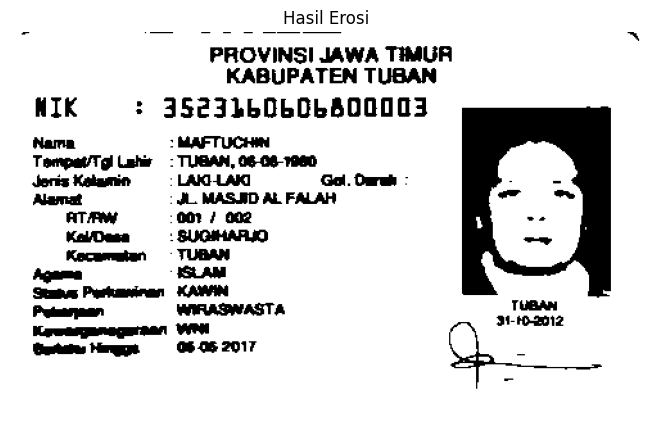

In [ ]:
# Ubah ke grayscale
gray = cv2.cvtColor(blurred, cv2.COLOR_BGR2GRAY)
ret, bw = cv2.threshold(gray.copy(), 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

# Terapkan operasi morfologi erosi
erode = cv2.erode(bw.copy(), cv2.getStructuringElement(cv2.MORPH_OPEN, (1, 1)))

plt.figure(figsize=(15, 5))
plt.imshow(erode, cmap='gray')
plt.title('Hasil Erosi')
plt.axis('off')
plt.show()

**7. Ekstraksi Kontur**

Terapkan ekstraksi kontur untuk untuk mendapatkan semua kontur setiap karakter/obyek.
Kontur harus diseleksi berdasarkan ukuran dan rasio sebuah karakter. Karakter/obyek di
dalam KTP ini bervariasi ukuran dan rasionya, sehingga setiap karakter/obyek perlu
penanganan yang berbeda. Contoh pada praktik ini berfokus pada karakter yang seukuran
dengan NIK. Jika hasil ekstraksi kontur memperlihatkan hasil lain yaitu karakter lain
terdeteksi, hal tersebut wajar karena perlu optimize code dan preprocessing yang lebih baik
(karena hasil akuisisi setiap citra dapat berbeda).

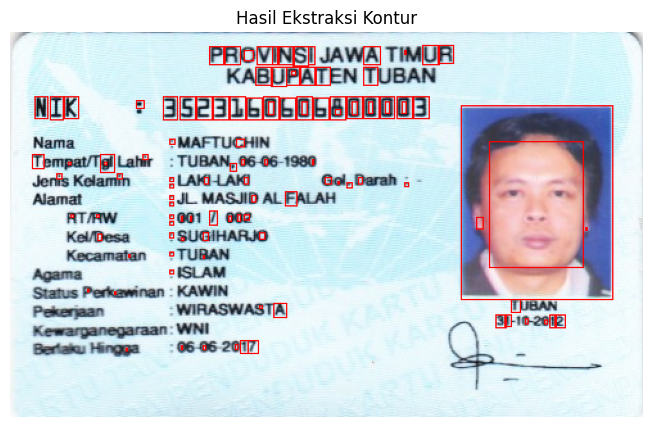

In [ ]:
blurred = cv.GaussianBlur(img, (5, 5), 0.5)

gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
# Looping contours untuk mendapatkan kontur yang sesuai
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 4 and w >= 1 and float(ras) <= 1:
      cv.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 2 and w >= 1 and float(ras) <= 1:
      cv.rectangle(img, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

plt.figure(figsize=(15,5))
plt.axis('off')
plt.title('Hasil Ekstraksi Kontur')
plt.imshow(cv.cvtColor(img, cv.COLOR_BGR2RGB))

# **TUGAS**

**KTP 1 = Riyanto Sleman**

Setiap citra memiliki karakteristik yang berbeda. Terapkan praktik pada materi pengayaan KTP untuk setiap dataset KTP yang tersedia. Perhatikan kondisi awal dataset, terapkan preprocessing yang sesuai jika kualitas visual citra kurang memadai untuk segera diolah.

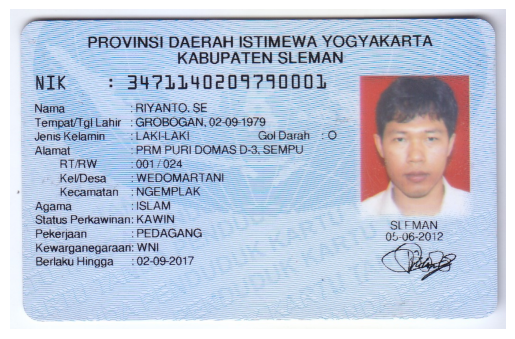

In [ ]:
# Load image
ktp = cv.imread('/content/drive/MyDrive/Images/KTP4.png')
plt.axis('off')
plt.imshow(cv.cvtColor(ktp, cv.COLOR_BGR2RGB))

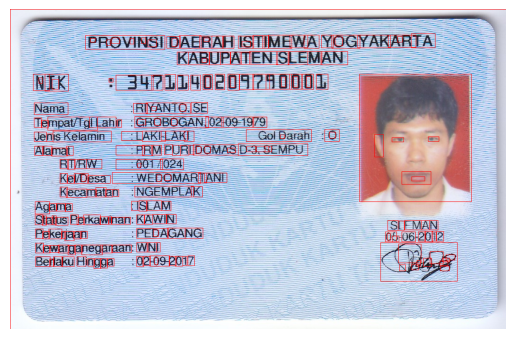

In [ ]:
# Terapkan Gaussian Blur
blurred = cv.GaussianBlur(ktp, (5, 5), 0.5)

# Grayscale dan Thresholding
gray = cv.cvtColor(blurred, cv.COLOR_BGR2GRAY)
ret, bw = cv.threshold(gray.copy(), 0, 255, cv.THRESH_BINARY + cv.THRESH_OTSU)

# Morfologi Erosi
erode = cv.erode(bw.copy(), cv.getStructuringElement(cv.MORPH_OPEN, (1, 1)))

# Ekstraksi kontur
contours, hierarchy = cv.findContours(erode.copy(), cv.RETR_TREE, cv.CHAIN_APPROX_NONE)
for cnt in contours:
    x, y, w, h = cv.boundingRect(cnt)
    ras = format(w / h, '.2f')
    if h >= 40 and w >= 10 and float(ras) <= 1:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 8 and w >= 8 and float(ras) <= 10:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)
    elif h >= 10 and w >= 7 and float(ras) <= 8:
      cv.rectangle(ktp, (x, y), (x + w, y + h), (0, 0, 255), thickness=1)

ktp_rgb = cv.cvtColor(ktp, cv.COLOR_BGR2RGB)
plt.imshow(ktp_rgb)
plt.axis('off')
plt.show()